In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

## Communities based on hallmark genes

In [40]:
file_network = "~/6_network_analysis/foldseekCluster90_1E-5_network_evalue_below_1E-3_plddt_above_50.csv"
df_network = pd.read_csv(file_network)
file_stats = "~/7_functional_coverage_expansion/foldseekCluster90_1E-5_stats_single_interproscan_1E-3.csv"
df_stats = pd.read_csv(file_stats)
file_meta = "~/4_structural_clustering/foldseekCluster90_1E-5/foldseekCluster90_1E-5_meta.csv"
df_meta = pd.read_csv(file_meta)

## Visualise the network

In [4]:
# read the graph
import json
import networkx as nx
from networkx.readwrite import json_graph

# Load the JSON data from a file
with open("~/6_network_analysis/foldseekCluster90_1E-5_structure_similarity_network_1E-3_plddt_above_50.json", 'r') as f:
    data = json.load(f)

# Create a new graph from the JSON data
G = json_graph.node_link_graph(data)

In [5]:
# Read positions from the file
with open("~/6_network_analysis/node_positions_network_1E-3_plddt_above_50_k0.4_iter500.json", 'r') as f:
    pos = json.load(f)

# Convert keys back to integers if necessary
pos = {int(k): v for k, v in pos.items()}

In [ ]:
import plotly.express as px

# Define functin types
function_types = list(df_stats['Pfam_annotation'].value_counts().head(25).index)


function_types_remove = [
    'Zinc finger, C3HC4 type (RING finger)',
    'TT viral ORF2-like',
    'Nucleopolyhedrovirus protein of unknown function (DUF919)',
    'Ring finger domain',
    'Collagen triple helix repeat (20 copies)'
]

for pfam_annotation in function_types_remove:
    function_types.remove(pfam_annotation)

# Get colors from Plotly colors
colors = px.colors.qualitative.Dark24

# Create a mapping from function types to colors
color_map = dict(zip(function_types, colors))

#color_map['other'] = 'lightgrey'

node_color = []

for n, d in G.nodes(data=True):
    cluster = d['pfam_annotation']
    if cluster in color_map:
        node_color.append(color_map[cluster])
    else:
        node_color.append('lightgrey')

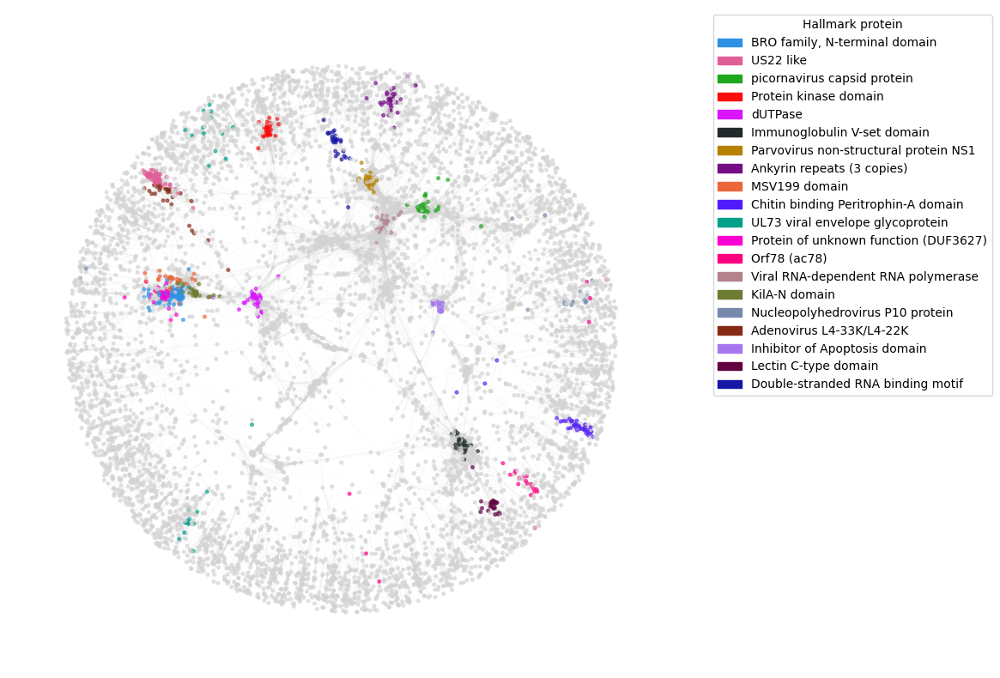

In [74]:
# Draw the graph
plt.figure(figsize=(10, 10))

# Draw the graph
nx.draw_networkx_nodes(
    G, pos,
    node_size=7,
    node_color=node_color, alpha=0.6)

# Draw the edges
nx.draw_networkx_edges(
    G, pos, edge_color='lightgray', alpha=0.5, width=0.1)

# Create legend
import matplotlib.patches as mpatches
legend_handles = [mpatches.Patch(color=color_map[rank], label=rank) for rank in color_map.keys()]
plt.legend(handles=legend_handles, title="Pfam domain", bbox_to_anchor=(1.05, 1), loc='upper left')

# remove the frame
plt.axis('off')

# save the plot as svg
plt.savefig("./foldseekCluster90_0.4_500_pfam_communities.png", dpi=600, bbox_inches='tight')
plt.savefig("./foldseekCluster90_0.4_500_pfam_communities.svg", format='svg', bbox_inches='tight')

plt.show()

## Plotly network visualization

In [ ]:
for n, d in G.nodes(data=True):
    
    pfam_annotation = df_stats[df_stats['cluster_id'] == n]['Pfam_annotation'].values[0]
    molecular_function = df_stats[df_stats['cluster_id'] == n]['molecular_function_annotation'].values[0]
    biological_process = df_stats[df_stats['cluster_id'] == n]['biological_process_annotation'].values[0]
    cellular_component = df_stats[df_stats['cluster_id'] == n]['cellular_component_annotation'].values[0]

    G.nodes[n]['pfam_annotation'] = pfam_annotation
    G.nodes[n]['molecular_function'] = molecular_function
    G.nodes[n]['biological_process'] = biological_process
    G.nodes[n]['cellular_component'] = cellular_component

    print(n, pfam_annotation, molecular_function, biological_process, cellular_component, sep='\t')

In [44]:
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

edge_dict = {'edge_x': [],
             'edge_y': [],
             'edge_info': []}

for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_dict['edge_x'].append(x0)
    edge_dict['edge_x'].append(x1)
    edge_dict['edge_x'].append(None)
    edge_dict['edge_y'].append(y0)
    edge_dict['edge_y'].append(y1)
    edge_dict['edge_y'].append(None)

edge_trace = go.Scatter(
    x=edge_dict['edge_x'],
    y=edge_dict['edge_y'],
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines')

In [45]:
node_dict = {
    'node_x': [],
    'node_y': [],
    'info': []}

for node in G.nodes(data=True):
    x, y = pos[node[0]]
    node_dict['node_x'].append(x)
    node_dict['node_y'].append(y)
    node_dict['info'].append(f"Cluster ID: {node[0]}<br>Cluster size: {node[1]['cluster_size']}<br>Pfam: {node[1]['pfam_annotation']}<br>Gene3D: {node[1]['gene3d_annotation']}<br>Superfamily: {node[1]['superfamily_annotation']}<br>Molecular function: {node[1]['molecular_function']}<br>Biological process: {node[1]['biological_process']}<br>Cellular component: {node[1]['cellular_component']}")

node_trace = go.Scatter(
    x=node_dict['node_x'],
    y=node_dict['node_y'],
    mode='markers',
    hoverinfo='text',
    text=node_dict['info'],
    marker=dict(
        showscale=True,
        # colorscale options
        #'Greys' | 'YlGnBu' | 'Greens' | 'YlOrRd' | 'Bluered' | 'RdBu' |
        #'Reds' | 'Blues' | 'Picnic' | 'Rainbow' | 'Portland' | 'Jet' |
        #'Hot' | 'Blackbody' | 'Earth' | 'Electric' | 'Viridis' |
        colorscale='YlGnBu',
        reversescale=True,
        color=[],
        size=10,
        colorbar=dict(
            thickness=15,
            title='Node Connections',
            xanchor='left',
            titleside='right'
        ),
        line_width=2))

In [75]:
# Create the Plotly figure
fig = go.Figure(layout=go.Layout(plot_bgcolor='white', paper_bgcolor='white'))

# Make figure 12 x 12 inches
fig.update_layout(
    width=1200,
    height=1200,
    showlegend=False,
    hovermode='closest',
    margin=dict(b=20,l=5,r=5,t=40),
    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))

# Add edges
fig.add_trace(go.Scatter(
    x=edge_dict['edge_x'], y=edge_dict['edge_y'],
    line=dict(width=0.35, color='lightgray'),
    hoverinfo='none',
    mode='lines'))

# Add nodes
fig.add_trace(go.Scatter(
    x=node_dict['node_x'], y=node_dict['node_y'],
    mode='markers',
    hoverinfo='text',
    text=node_dict['info'],
    marker=dict(
        size=6,
        color=node_color,
        opacity=0.8,
        line=dict(width=0.1, color='black')
        )
    )
)

# Update layout
fig.update_layout(showlegend=False)

# Save the figure as an HTML file
fig.write_html("./foldseekCluster90_1e-5_pfam_communities.html")

fig.show()